<a href="https://colab.research.google.com/github/sanu1230/Professional_Projects/blob/master/2015_Flight_Delay_%26_Cancellation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 2015 Flight Delay & Cancellation

### Business Problem

To classify whether a flight will be delayed or not by more than 10 mins.

**Feature Columns**

MONTH, DAY, DAY_OF_WEEK: data type int <br>
AIRLINE and FLIGHT_NUMBER: data type int <br>
ORIGIN_AIRPORT and DESTINATION_AIRPORT: data type string <br>
SCHEDUAL_DEPARTURE, DEPARTURE_TIME, DEPARTURE_DELAY,
SCHEDUAL_ARRIVAL, ARRIVAL_TIME : data type float <br>
ARRIVAL_DELAY: this will be the target and is transformed into boolean variable indicating delay of more than 10 minutes <br>
DISTANCE and AIR_TIME: data type float <br>


You can learn more about this dataset from the folowing Kaggle link.
https://www.kaggle.com/usdot/flight-delays/data?source=post_page---------------------------

**Objectve**:
To determine whether the flight will be delayed or not.

### Import necessary packages

In [ ]:
!pip -q install pandas_profiling==2.5.0

In [ ]:
!pip freeze | grep pandas

pandas==0.25.3
pandas-datareader==0.8.1
pandas-gbq==0.11.0
pandas-profiling==2.5.0
sklearn-pandas==1.8.0


In [ ]:
!pip -q install imgaug==0.2.6
!pip -q install lime
!pip -q install Shap
!pip -q install Eli5

In [ ]:
import pandas as pd
import numpy as np
import time
import pandas_profiling
import matplotlib.pyplot as plt
import plotly.express as px
%matplotlib inline
import seaborn as sns

## Loading Data

In [ ]:
!wget https://www.dropbox.com/s/qnhemj7ufhiyzhi/flights.csv.zip?dl=0

--2020-07-16 19:18:40--  https://www.dropbox.com/s/qnhemj7ufhiyzhi/flights.csv.zip?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.5.1, 2620:100:601d:1::a27d:501
Connecting to www.dropbox.com (www.dropbox.com)|162.125.5.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/qnhemj7ufhiyzhi/flights.csv.zip [following]
--2020-07-16 19:18:40--  https://www.dropbox.com/s/raw/qnhemj7ufhiyzhi/flights.csv.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://ucf556af7980ea8877ddec48d8e2.dl.dropboxusercontent.com/cd/0/inline/A7obs8hSn70ZC6-EUttJhfFWrnGXqWlXW2nfSe3iyOXlxjCSjnJJ9MC5_Y4S3H4Z8oVx1WtkEMOBK88-Gi6eQNxe5eZjM5h9-Xj5-996RKqIHg/file# [following]
--2020-07-16 19:18:40--  https://ucf556af7980ea8877ddec48d8e2.dl.dropboxusercontent.com/cd/0/inline/A7obs8hSn70ZC6-EUttJhfFWrnGXqWlXW2nfSe3iyOXlxjCSjnJJ9MC5_Y4S3H4Z8oVx1WtkEMOBK88-Gi6eQNxe5eZjM5h9-Xj5-996RKqIHg/file
Resol

In [ ]:
!unzip flights.csv.zip?dl=0

Archive:  flights.csv.zip?dl=0
replace flights.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: flights.csv             




In [ ]:
df = pd.read_csv("flights.csv")                  # Reading the dataset
df.head()

,YEAR,MONTH,DAY,DAY_OF_WEEK,AIRLINE,FLIGHT_NUMBER,TAIL_NUMBER,ORIGIN_AIRPORT,DESTINATION_AIRPORT,SCHEDULED_DEPARTURE,DEPARTURE_TIME,DEPARTURE_DELAY,TAXI_OUT,WHEELS_OFF,SCHEDULED_TIME,ELAPSED_TIME,AIR_TIME,DISTANCE,WHEELS_ON,TAXI_IN,SCHEDULED_ARRIVAL,ARRIVAL_TIME,ARRIVAL_DELAY,DIVERTED,CANCELLED,CANCELLATION_REASON,AIR_SYSTEM_DELAY,SECURITY_DELAY,AIRLINE_DELAY,LATE_AIRCRAFT_DELAY,WEATHER_DELAY
0,2015,1,1,4,AS,98,N407AS,ANC,SEA,5,2354.0,-11.0,21.0,15.0,205.0,194.0,169.0,1448,404.0,4.0,430,408.0,-22.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
1,2015,1,1,4,AA,2336,N3KUAA,LAX,PBI,10,2.0,-8.0,12.0,14.0,280.0,279.0,263.0,2330,737.0,4.0,750,741.0,-9.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
2,2015,1,1,4,US,840,N171US,SFO,CLT,20,18.0,-2.0,16.0,34.0,286.0,293.0,266.0,2296,800.0,11.0,806,811.0,5.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
3,2015,1,1,4,AA,258,N3HYAA,LAX,MIA,20,15.0,-5.0,15.0,30.0,285.0,281.0,258.0,2342,748.0,8.0,805,756.0,-9.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,2015,1,1,4,AS,135,N527AS,SEA,ANC,25,24.0,-1.0,11.0,35.0,235.0,215.0,199.0,1448,254.0,5.0,320,259.0,-21.0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


## Data Summary

In [ ]:
df.describe()

,YEAR,MONTH,DAY,DAY_OF_WEEK,FLIGHT_NUMBER,SCHEDULED_DEPARTURE,DEPARTURE_TIME,DEPARTURE_DELAY,TAXI_OUT,WHEELS_OFF,SCHEDULED_TIME,ELAPSED_TIME,AIR_TIME,DISTANCE,WHEELS_ON,TAXI_IN,SCHEDULED_ARRIVAL,ARRIVAL_TIME,ARRIVAL_DELAY,DIVERTED,CANCELLED,AIR_SYSTEM_DELAY,SECURITY_DELAY,AIRLINE_DELAY,LATE_AIRCRAFT_DELAY,WEATHER_DELAY
count,5819079.0,5.819079e+06,5.819079e+06,5.819079e+06,5.819079e+06,5.819079e+06,5.732926e+06,5.732926e+06,5.730032e+06,5.730032e+06,5.819073e+06,5.714008e+06,5.714008e+06,5.819079e+06,5.726566e+06,5.726566e+06,5.819079e+06,5.726566e+06,5.714008e+06,5.819079e+06,5.819079e+06,1.063439e+06,1.063439e+06,1.063439e+06,1.063439e+06,1.063439e+06
mean,2015.0,6.524085e+00,1.570459e+01,3.926941e+00,2.173093e+03,1.329602e+03,1.335204e+03,9.370158e+00,1.607166e+01,1.357171e+03,1.416859e+02,1.370062e+02,1.135116e+02,8.223565e+02,1.471469e+03,7.434971e+00,1.493808e+03,1.476491e+03,4.407057e+00,2.609863e-03,1.544643e-02,1.348057e+01,7.615387e-02,1.896955e+01,2.347284e+01,2.915290e+00
std,0.0,3.405137e+00,8.783425e+00,1.988845e+00,1.757064e+03,4.837518e+02,4.964233e+02,3.708094e+01,8.895574e+00,4.980094e+02,7.521058e+01,7.421107e+01,7.223082e+01,6.077843e+02,5.221879e+02,5.638548e+00,5.071647e+02,5.263197e+02,3.927130e+01,5.102012e-02,1.233201e-01,2.800368e+01,2.143460e+00,4.816164e+01,4.319702e+01,2.043334e+01
min,2015.0,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,-8.200000e+01,1.000000e+00,1.000000e+00,1.800000e+01,1.400000e+01,7.000000e+00,2.100000e+01,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,-8.700000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,2015.0,4.000000e+00,8.000000e+00,2.000000e+00,7.300000e+02,9.170000e+02,9.210000e+02,-5.000000e+00,1.100000e+01,9.350000e+02,8.500000e+01,8.200000e+01,6.000000e+01,3.730000e+02,1.054000e+03,4.000000e+00,1.110000e+03,1.059000e+03,-1.300000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
50%,2015.0,7.000000e+00,1.600000e+01,4.000000e+00,1.690000e+03,1.325000e+03,1.330000e+03,-2.000000e+00,1.400000e+01,1.343000e+03,1.230000e+02,1.180000e+02,9.400000e+01,6.470000e+02,1.509000e+03,6.000000e+00,1.520000e+03,1.512000e+03,-5.000000e+00,0.000000e+00,0.000000e+00,2.000000e+00,0.000000e+00,2.000000e+00,3.000000e+00,0.000000e+00
75%,2015.0,9.000000e+00,2.300000e+01,6.000000e+00,3.230000e+03,1.730000e+03,1.740000e+03,7.000000e+00,1.900000e+01,1.754000e+03,1.730000e+02,1.680000e+02,1.440000e+02,1.062000e+03,1.911000e+03,9.000000e+00,1.918000e+03,1.917000e+03,8.000000e+00,0.000000e+00,0.000000e+00,1.800000e+01,0.000000e+00,1.900000e+01,2.900000e+01,0.000000e+00
max,2015.0,1.200000e+01,3.100000e+01,7.000000e+00,9.855000e+03,2.359000e+03,2.400000e+03,1.988000e+03,2.250000e+02,2.400000e+03,7.180000e+02,7.660000e+02,6.900000e+02,4.983000e+03,2.400000e+03,2.480000e+02,2.400000e+03,2.400000e+03,1.971000e+03,1.000000e+00,1.000000e+00,1.134000e+03,5.730000e+02,1.971000e+03,1.331000e+03,1.211000e+03


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5819079 entries, 0 to 5819078
Data columns (total 31 columns):
YEAR                   int64
MONTH                  int64
DAY                    int64
DAY_OF_WEEK            int64
AIRLINE                object
FLIGHT_NUMBER          int64
TAIL_NUMBER            object
ORIGIN_AIRPORT         object
DESTINATION_AIRPORT    object
SCHEDULED_DEPARTURE    int64
DEPARTURE_TIME         float64
DEPARTURE_DELAY        float64
TAXI_OUT               float64
WHEELS_OFF             float64
SCHEDULED_TIME         float64
ELAPSED_TIME           float64
AIR_TIME               float64
DISTANCE               int64
WHEELS_ON              float64
TAXI_IN                float64
SCHEDULED_ARRIVAL      int64
ARRIVAL_TIME           float64
ARRIVAL_DELAY          float64
DIVERTED               int64
CANCELLED              int64
CANCELLATION_REASON    object
AIR_SYSTEM_DELAY       float64
SECURITY_DELAY         float64
AIRLINE_DELAY          float64
LATE_AIRCRAFT

In [ ]:
df.shape

(5819079, 31)

- Since the data we have is quite huge nearly 58 lac rows and 31 features, hence we will try to reduce by dropping few unwanted features.

## Selecting Features

In [ ]:
# Selecting important features

df = df[["MONTH", "DAY", "DAY_OF_WEEK", "AIRLINE", "FLIGHT_NUMBER", "DESTINATION_AIRPORT", "ORIGIN_AIRPORT", 
         "SCHEDULED_DEPARTURE", "DEPARTURE_TIME", "DEPARTURE_DELAY", 
         "SCHEDULED_ARRIVAL", "ARRIVAL_TIME", "ARRIVAL_DELAY", "AIR_TIME", "DISTANCE"]]

In [ ]:
#@title Save 1
df1 = df.copy()

In [ ]:
#@title Restore Save 1
df = df1.copy()

## Data Sample

In [ ]:
df = df.sample(n=10000, random_state= 10, axis=0)
df.shape

(10000, 15)

## Pandas Profiling

In [ ]:
report = pandas_profiling.ProfileReport(df)
report.to_file('flight_df.html')

In [ ]:
from IPython.display import display, HTML, IFrame
display(HTML(open('flight_df.html').read()))

Number of variables,16
Number of observations,10000
Missing cells,957
Missing cells (%),0.6%
Duplicate rows,0
Duplicate rows (%),0.0%
Total size in memory,2.7 MiB
Average record size in memory,279.4 B
NUM,13
UNSUPPORTED,2
CAT,1


**Observation:-** As per Pandas Profiling
- High Correlation between:-
    - MONTH & df_index, 
    - DEPARTURE_TIME & SCHEDULED_DEPARTURE, 
    - ARRIVAL_DELAY & DEPARTURE_DELAY, 
    - DISTANCE & AIR_TIME. 
- DESTINATION_AIRPORT & ORIGIN_AIRPORT has 3 letter apha values and some have numerical values hence need to work on. 
- DEPARTURE_DELAY has 572 (5.7%) zeros, which means flight on time so ignore
- ARRIVAL_DELAY has 232 (2.3%) zeros, which means flight on time so ignore
- DEPARTURE_TIME has 179 (1.8%) missing values
- DEPARTURE_DELAY has 179 (1.8%) missing values
- ARRIVAL_TIME has 185 (1.8%) missing values
- ARRIVAL_DELAY has 207 (2.1%) missing values	
- AIR_TIME has 207 (2.1%) missing values

## Missing Values#

In [ ]:
# Origin and Destination airport has few values which are numeric

# Making a function to replace all numerical values in origin and destination airport feature with np.nan
def Replace(i):
    try:
      if str(i).isalpha():
        return str(i)
    except:
      i == np.nan
      return i


In [ ]:
# Applying function to replace
df['DESTINATION_AIRPORT'] = df['DESTINATION_AIRPORT'].apply(func=Replace)
df['ORIGIN_AIRPORT'] = df['ORIGIN_AIRPORT'].apply(func=Replace)
df.isna().sum()

MONTH                    0
DAY                      0
DAY_OF_WEEK              0
AIRLINE                  0
FLIGHT_NUMBER            0
DESTINATION_AIRPORT    790
ORIGIN_AIRPORT         790
SCHEDULED_DEPARTURE      0
DEPARTURE_TIME         179
DEPARTURE_DELAY        179
SCHEDULED_ARRIVAL        0
ARRIVAL_TIME           185
ARRIVAL_DELAY          207
AIR_TIME               207
DISTANCE                 0
dtype: int64

**Observation**
- Departure Time, Departure Delay, Arrival Time, Arrival Delay and Air Time has missing value. 
- Lets drop all missng values as its less then 2% of the entire data, and filling it with median or mode will not give a real or close to real time of departure or arrival. 
- Airtime missing is for the same data which has arrival and departure time and delay time missing. Hence drop all nan

In [ ]:
# Dropping all NAN missing values
df.dropna(inplace=True)
df.shape

(9013, 15)

**Now we have 9013 data with 15 features**

In [ ]:
df.head()

,MONTH,DAY,DAY_OF_WEEK,AIRLINE,FLIGHT_NUMBER,DESTINATION_AIRPORT,ORIGIN_AIRPORT,SCHEDULED_DEPARTURE,DEPARTURE_TIME,DEPARTURE_DELAY,SCHEDULED_ARRIVAL,ARRIVAL_TIME,ARRIVAL_DELAY,AIR_TIME,DISTANCE
411984,1,28,3,WN,103,MKE,DCA,705,713.0,8.0,810,811.0,1.0,102.0,634
3591965,8,11,2,B6,153,PBI,JFK,1859,111.0,372.0,2208,345.0,337.0,134.0,1028
526451,2,4,3,DL,1187,DCA,MSP,1735,1734.0,-1.0,2102,2043.0,-19.0,111.0,931
1336011,3,27,5,WN,171,RDU,DEN,1815,1807.0,-8.0,2320,2313.0,-7.0,173.0,1436
3424502,8,1,6,WN,4330,RIC,ATL,2125,2151.0,26.0,2305,2318.0,13.0,63.0,481


In [ ]:
#@title Save 2
df2 = df.copy()

In [ ]:
#@title Restore Save 2
df = df2.copy()

# Data Visualization

In [ ]:
#@title Avg. Departure Delay based on AIRLINE

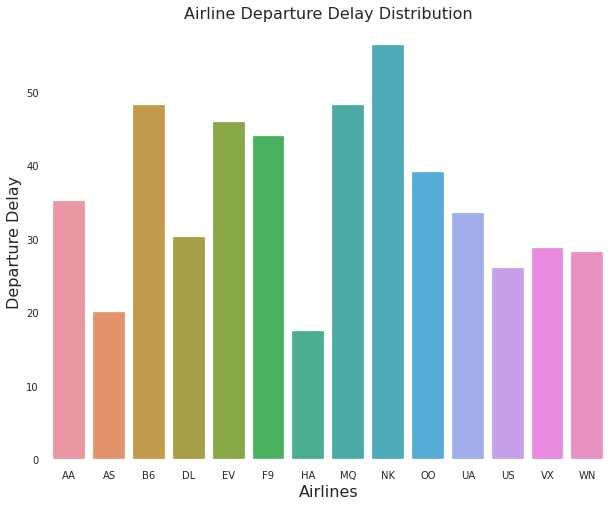

In [ ]:
df_delay = df[df.DEPARTURE_DELAY >= 1]
dep_delayed_flights = df_delay.groupby(['AIRLINE'], as_index=False).agg({'DEPARTURE_DELAY': 'mean'})

f,ax = plt.subplots(figsize=(10, 8))
sns.barplot('AIRLINE','DEPARTURE_DELAY', data=dep_delayed_flights ,ax=ax)
ax.set_title('Airline Departure Delay Distribution', fontsize=16)
ax.set_ylabel("Departure Delay", fontsize=16)
ax.set_xlabel("Airlines", fontsize=16)
plt.close(2)
plt.show()

In [ ]:
#@title Avg. Arrival Delay based on AIRLINE

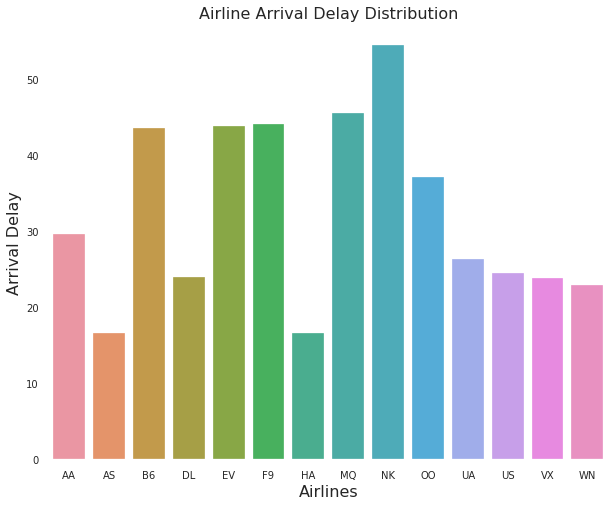

In [ ]:
df_delay1 = df[df.ARRIVAL_DELAY >= 1]
dep_delayed_flights = df_delay.groupby(['AIRLINE'], as_index=False).agg({'ARRIVAL_DELAY': 'mean'})

f,ax = plt.subplots(figsize=(10, 8))
sns.barplot('AIRLINE','ARRIVAL_DELAY', data=dep_delayed_flights ,ax=ax)
ax.set_title('Airline Arrival Delay Distribution', fontsize=16)
ax.set_ylabel("Arrival Delay", fontsize=16)
ax.set_xlabel("Airlines", fontsize=16)
plt.close(2)
plt.show()

In [ ]:
#@title Top 10 Airports with max DEPARTURE_DELAY

In [ ]:
# To find the max 10th departure delay
df.nlargest(10, 'DEPARTURE_DELAY')[9:]

,MONTH,DAY,DAY_OF_WEEK,AIRLINE,FLIGHT_NUMBER,DESTINATION_AIRPORT,ORIGIN_AIRPORT,SCHEDULED_DEPARTURE,DEPARTURE_TIME,DEPARTURE_DELAY,SCHEDULED_ARRIVAL,ARRIVAL_TIME,ARRIVAL_DELAY,AIR_TIME,DISTANCE
5196827,11,21,6,MQ,3132,ORD,CID,1215,1924.0,429.0,1331,2038.0,427.0,39.0,196


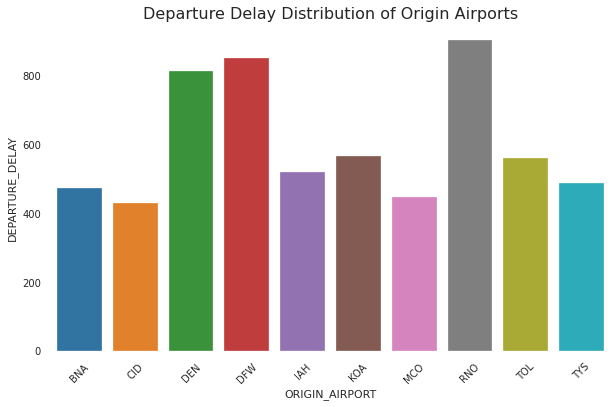

In [ ]:
# We see that the 10th larges value for Departure Delay is 429 minutes

dep_delay_airports = df[df['DEPARTURE_DELAY']>427][['ORIGIN_AIRPORT', 'DEPARTURE_DELAY']]

dep_delay_airports['ORIGIN_AIRPORT'] = dep_delay_airports['ORIGIN_AIRPORT'].astype('category')

f, ax= plt.subplots(figsize=(10, 6))
sns.barplot('ORIGIN_AIRPORT', 'DEPARTURE_DELAY', data=dep_delay_airports, ax=ax)
ax.set_title('Departure Delay Distribution of Origin Airports', fontsize=16)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
plt.close(2)
plt.show()


In [ ]:
#@title Top 10 Airports with max ARRIVAL_DELAY

In [ ]:
# To find the max 10th arrival delay
df.nlargest(10, 'ARRIVAL_DELAY')[9:]

,MONTH,DAY,DAY_OF_WEEK,AIRLINE,FLIGHT_NUMBER,DESTINATION_AIRPORT,ORIGIN_AIRPORT,SCHEDULED_DEPARTURE,DEPARTURE_TIME,DEPARTURE_DELAY,SCHEDULED_ARRIVAL,ARRIVAL_TIME,ARRIVAL_DELAY,AIR_TIME,DISTANCE
5726760,12,26,6,AA,1352,LAX,MIA,639,1251.0,372.0,919,1633.0,434.0,312.0,2342


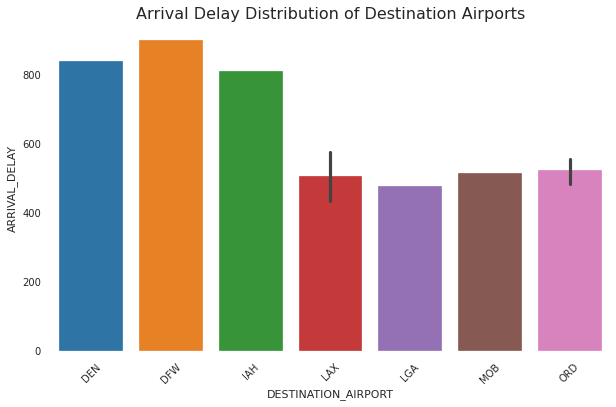

In [ ]:
# We see that the 10th larges value for Arrival Delay is 434 minutes

arr_delay_airports = df[df['ARRIVAL_DELAY']>427][['DESTINATION_AIRPORT', 'ARRIVAL_DELAY']]
arr_delay_airports['DESTINATION_AIRPORT'] = arr_delay_airports['DESTINATION_AIRPORT'].astype('category')


f, ax= plt.subplots(figsize=(10, 6))
sns.barplot('DESTINATION_AIRPORT', 'ARRIVAL_DELAY', data=arr_delay_airports, ax=ax, saturation=.8)
ax.set_title('Arrival Delay Distribution of Destination Airports', fontsize=16)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
plt.close(2)
plt.show()


In [ ]:
#@title  Departure Delay on Monthly basis

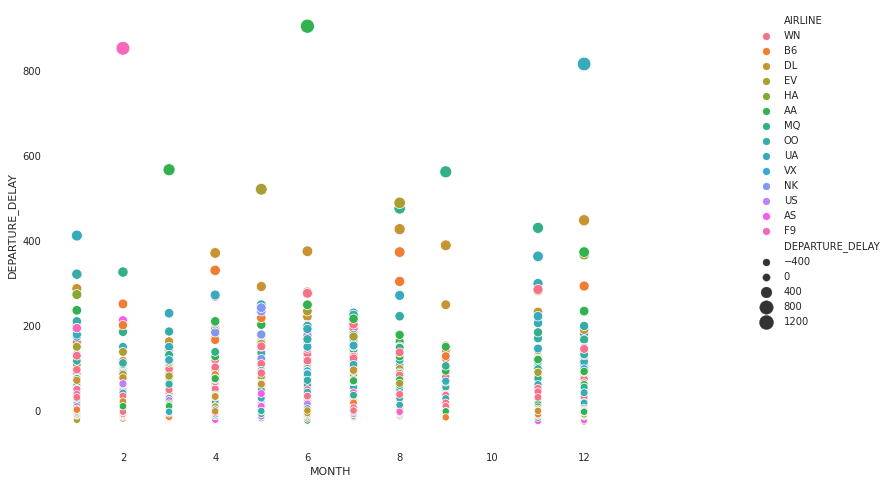

In [ ]:
f, ax = plt.subplots(figsize=(10, 8))
sns.scatterplot('MONTH', "DEPARTURE_DELAY", data=df, size='DEPARTURE_DELAY', hue='AIRLINE', sizes=(50, 200))
plt.legend(bbox_to_anchor=(1.5,1) , loc='upper right')

**Observation** - Our sample data does not have data for 10th month

In [ ]:
#@title  Arrival Delay on Monthly basis

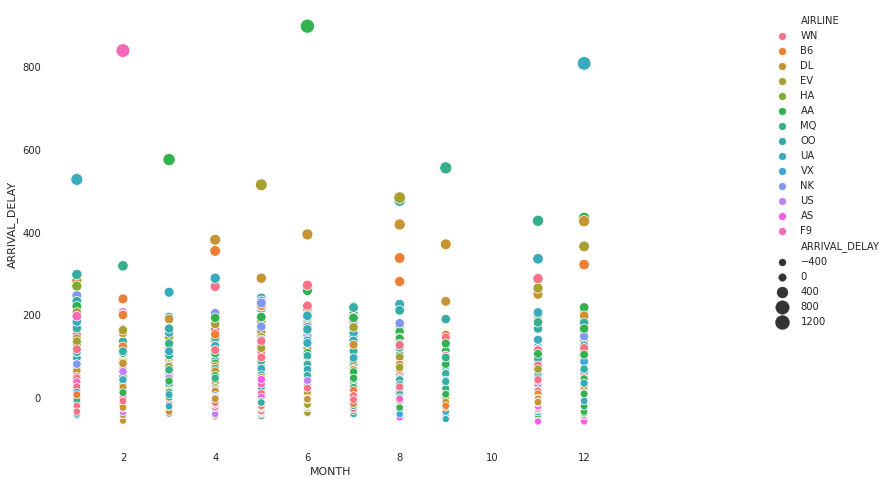

In [ ]:
f, ax = plt.subplots(figsize=(10, 8))
sns.scatterplot('MONTH', "ARRIVAL_DELAY", data=df, size='ARRIVAL_DELAY', hue='AIRLINE', sizes=(50, 200))
plt.legend(bbox_to_anchor=(1.5,1) , loc='upper right')

**Observation**
- From above both the plots we see that maximum delay's are in the month of February, June & December

In [ ]:
#@title Top 10 maximum delay flight numbers

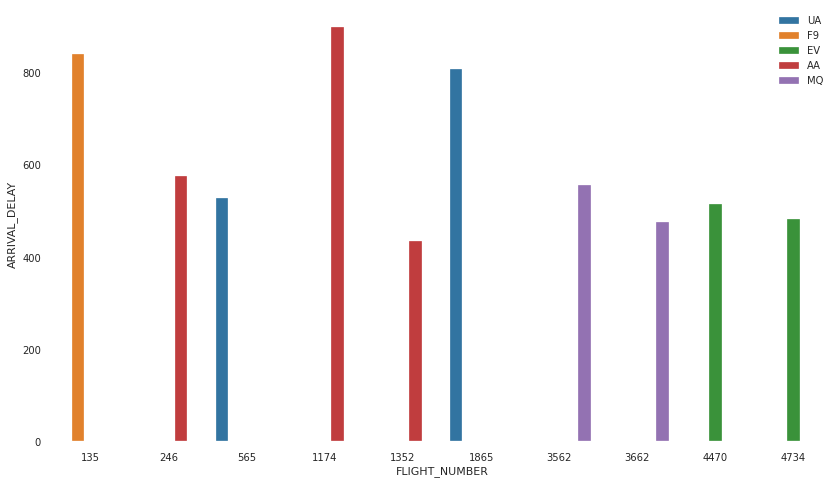

In [ ]:
arr_delay_flightnum = df[df['ARRIVAL_DELAY']>430][['FLIGHT_NUMBER', 'ARRIVAL_DELAY', 'AIRLINE']]
arr_delay_log = np.log(df['ARRIVAL_DELAY'])
f, ax = plt.subplots(figsize=(14, 8))
sns.barplot('FLIGHT_NUMBER', 'ARRIVAL_DELAY', data=arr_delay_flightnum, hue='AIRLINE')

ax.legend(bbox_to_anchor=(1, 1), loc='upper right')


In [ ]:
#@title Save 3
df3 = df.copy()

In [ ]:
#@title Restore Save 3
df = df3.copy()

## Feature Engineering

In [ ]:
# using labelencoding and give conditions to Arrival delay colum
df['ARRIVAL_DELAY'].value_counts()

-10.0     312
-8.0      297
-11.0     281
-13.0     281
-5.0      267
         ... 
 354.0      1
 214.0      1
 202.0      1
 238.0      1
 221.0      1
Name: ARRIVAL_DELAY, Length: 296, dtype: int64

In [ ]:
df["ARRIVAL_DELAY"] = (df["ARRIVAL_DELAY"]>10)*1    # Checking if delay is greater than 10 mins
df['ARRIVAL_DELAY'].value_counts()

0    6980
1    2033
Name: ARRIVAL_DELAY, dtype: int64

In [ ]:
# So we see that 2033 fights in our sample data has arrival delay more than 10 minutes

In [ ]:
df.head()

,MONTH,DAY,DAY_OF_WEEK,AIRLINE,FLIGHT_NUMBER,DESTINATION_AIRPORT,ORIGIN_AIRPORT,SCHEDULED_DEPARTURE,DEPARTURE_TIME,DEPARTURE_DELAY,SCHEDULED_ARRIVAL,ARRIVAL_TIME,ARRIVAL_DELAY,AIR_TIME,DISTANCE
411984,1,28,3,WN,103,MKE,DCA,705,713.0,8.0,810,811.0,0,102.0,634
3591965,8,11,2,B6,153,PBI,JFK,1859,111.0,372.0,2208,345.0,1,134.0,1028
526451,2,4,3,DL,1187,DCA,MSP,1735,1734.0,-1.0,2102,2043.0,0,111.0,931
1336011,3,27,5,WN,171,RDU,DEN,1815,1807.0,-8.0,2320,2313.0,0,173.0,1436
3424502,8,1,6,WN,4330,RIC,ATL,2125,2151.0,26.0,2305,2318.0,1,63.0,481


## Converting Data Type

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9013 entries, 411984 to 953538
Data columns (total 15 columns):
MONTH                  9013 non-null int64
DAY                    9013 non-null int64
DAY_OF_WEEK            9013 non-null int64
AIRLINE                9013 non-null object
FLIGHT_NUMBER          9013 non-null int64
DESTINATION_AIRPORT    9013 non-null object
ORIGIN_AIRPORT         9013 non-null object
SCHEDULED_DEPARTURE    9013 non-null int64
DEPARTURE_TIME         9013 non-null float64
DEPARTURE_DELAY        9013 non-null float64
SCHEDULED_ARRIVAL      9013 non-null int64
ARRIVAL_TIME           9013 non-null float64
ARRIVAL_DELAY          9013 non-null int64
AIR_TIME               9013 non-null float64
DISTANCE               9013 non-null int64
dtypes: float64(4), int64(8), object(3)
memory usage: 1.1+ MB


In [ ]:
# We have features like AIRLINE, DESTINATION_AIRPORT, ORIGIN_AIRPORT which are categorical data
# Hence convert them to category

In [ ]:
# Categorical columns

cols = ["AIRLINE","DESTINATION_AIRPORT","ORIGIN_AIRPORT"]
for item in cols:
    df[item] = df[item].astype("category")

# Lets check data type again
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9013 entries, 411984 to 953538
Data columns (total 15 columns):
MONTH                  9013 non-null int64
DAY                    9013 non-null int64
DAY_OF_WEEK            9013 non-null int64
AIRLINE                9013 non-null category
FLIGHT_NUMBER          9013 non-null int64
DESTINATION_AIRPORT    9013 non-null category
ORIGIN_AIRPORT         9013 non-null category
SCHEDULED_DEPARTURE    9013 non-null int64
DEPARTURE_TIME         9013 non-null float64
DEPARTURE_DELAY        9013 non-null float64
SCHEDULED_ARRIVAL      9013 non-null int64
ARRIVAL_TIME           9013 non-null float64
ARRIVAL_DELAY          9013 non-null int64
AIR_TIME               9013 non-null float64
DISTANCE               9013 non-null int64
dtypes: category(3), float64(4), int64(8)
memory usage: 984.4 KB


In [ ]:
# Now lets LabelEncode the categorical features for Model building
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
col = ['AIRLINE', 'DESTINATION_AIRPORT', 'ORIGIN_AIRPORT']
le.fit(df[col].values.flatten())

df[col] = df[col].apply(le.fit_transform)
df.head()

,MONTH,DAY,DAY_OF_WEEK,AIRLINE,FLIGHT_NUMBER,DESTINATION_AIRPORT,ORIGIN_AIRPORT,SCHEDULED_DEPARTURE,DEPARTURE_TIME,DEPARTURE_DELAY,SCHEDULED_ARRIVAL,ARRIVAL_TIME,ARRIVAL_DELAY,AIR_TIME,DISTANCE
411984,1,28,3,13,103,174,70,705,713.0,8.0,810,811.0,0,102.0,634
3591965,8,11,2,2,153,200,138,1859,111.0,372.0,2208,345.0,1,134.0,1028
526451,2,4,3,3,1187,68,180,1735,1734.0,-1.0,2102,2043.0,0,111.0,931
1336011,3,27,5,13,171,220,71,1815,1807.0,-8.0,2320,2313.0,0,173.0,1436
3424502,8,1,6,13,4330,222,15,2125,2151.0,26.0,2305,2318.0,1,63.0,481


In [ ]:
#@title Save 4
df4 = df.copy()

In [ ]:
#@title Restoe Save 4
df = df4.copy()

## Splitting Data in X & y

In [ ]:
X = df.drop('ARRIVAL_DELAY', 1)
y = df['ARRIVAL_DELAY']

In [ ]:
X.head()

,MONTH,DAY,DAY_OF_WEEK,AIRLINE,FLIGHT_NUMBER,DESTINATION_AIRPORT,ORIGIN_AIRPORT,SCHEDULED_DEPARTURE,DEPARTURE_TIME,DEPARTURE_DELAY,SCHEDULED_ARRIVAL,ARRIVAL_TIME,AIR_TIME,DISTANCE
411984,1,28,3,13,103,174,70,705,713.0,8.0,810,811.0,102.0,634
3591965,8,11,2,2,153,200,138,1859,111.0,372.0,2208,345.0,134.0,1028
526451,2,4,3,3,1187,68,180,1735,1734.0,-1.0,2102,2043.0,111.0,931
1336011,3,27,5,13,171,220,71,1815,1807.0,-8.0,2320,2313.0,173.0,1436
3424502,8,1,6,13,4330,222,15,2125,2151.0,26.0,2305,2318.0,63.0,481


In [ ]:
# Normalizing data X

from sklearn.preprocessing import StandardScaler

#Lets Use Sandardscaler to normalise the data
scaler = StandardScaler()
scaler.fit(X)

# Scale and center the data
X_norm = scaler.transform(X)

# Create a pandas DataFrame
X = pd.DataFrame(data=X_norm, index=X.index, columns=X.columns)


In [ ]:
# Train test split

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=10, test_size=0.3)

### XGBoost

In [ ]:
import xgboost as xgb
from sklearn import metrics
from sklearn.model_selection import GridSearchCV

In [ ]:
# Function for model evaluation

def auc(m, X_train, X_test): 
    return (metrics.roc_auc_score(y_train,m.predict_proba(X_train)[:,1]),
            metrics.roc_auc_score(y_test,m.predict_proba(X_test)[:,1]))

In [ ]:
# XGBoost Model
%%time
model = xgb.XGBClassifier(max_depth=50, min_child_weight=1,  n_estimators=200,\
                          n_jobs=-1 , verbose=1, learning_rate=0.2)
model.fit(X_train, y_train)

auc(model, X_train, X_test)

CPU times: user 6.6 s, sys: 15.6 ms, total: 6.62 s
Wall time: 3.38 s


In [ ]:
y_pred = model.predict(X_test)

Accuracy:  0.933801775147929

********************************************
Confusion matrix


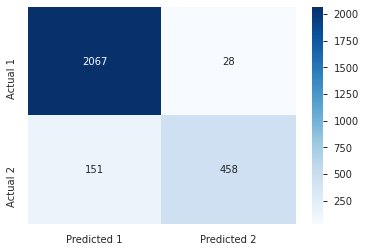

**********************************************
              precision    recall  f1-score   support

           0       0.93      0.99      0.96      2095
           1       0.94      0.75      0.84       609

    accuracy                           0.93      2704
   macro avg       0.94      0.87      0.90      2704
weighted avg       0.93      0.93      0.93      2704



In [ ]:
import matplotlib.pyplot as plt                               # Visualization package

%matplotlib inline
import seaborn as sns

print('Accuracy: ', metrics.accuracy_score(y_test,y_pred))
print('')
print('********************************************')
print('Confusion matrix')
lr_cfm=metrics.confusion_matrix(y_test, y_pred)


lbl1=["Predicted 1", "Predicted 2"]
lbl2=["Actual 1", "Actual 2"]

sns.heatmap(lr_cfm, annot=True, cmap="Blues", fmt="d", xticklabels=lbl1, yticklabels=lbl2)
plt.show()

print('**********************************************')
print(metrics.classification_report(y_test,y_pred))

### LightGBM

In [ ]:
import lightgbm as lgb  # ligther version of GBM 

In [ ]:
# Function to evaluate LightGBM model

def auc2(m, X_train, X_test):
    y_train_pred = m.predict(X_train)
    y_test_pred = m.predict(X_test)

    return (print('ROC AUC Train Score: ', metrics.roc_auc_score(y_train, y_train_pred)),
    print('ROC AUC Test Score: ', metrics.roc_auc_score(y_test, y_test_pred)),
    print('Avg. Precision Score: ', metrics.average_precision_score(y_test, y_test_pred)),
    print('Confusion Metrics: \n', metrics.confusion_matrix(y_test, y_test_pred)))

In [ ]:
def gini(y_test, y_test_pred):
    fpr, tpr, thr = metrics.roc_curve(y_test, y_pred, pos_label=1)
    g = 2 * metrics.auc(fpr, tpr) -1
    return g

def gini_lgb(preds, dtrain):
    y = list(dtrain.get_label())
    score = gini(y_test, y_test_pred,) / gini(y_test, y)
    return 'gini', score, True


In [ ]:
%%time
model2 = lgb.LGBMClassifier(n_estimators=90, 
                     silent=False, 
                     random_state =94, 
                     max_depth=5, 
                     num_leaves=30, 
                     objective='binary', 
                     metrics ='auc')

model2.fit(X_train, y_train, eval_metric=gini_lgb)

CPU times: user 340 ms, sys: 18.4 ms, total: 358 ms
Wall time: 235 ms


In [ ]:
auc2(model2, X_train, X_test)

ROC AUC Train Score:  0.8962734897013329
ROC AUC Test Score:  0.8444744896559563
Avg. Precision Score:  0.7251320612544341
Confusion Metrics: 
 [[2066   29]
 [ 181  428]]


(None, None, None, None)

0.9223372781065089
********************************************
Confusion matrix


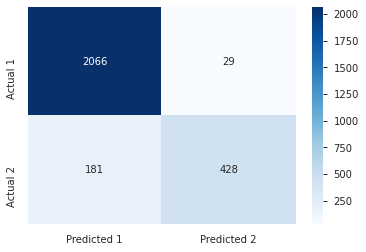

**********************************************
              precision    recall  f1-score   support

           0       0.92      0.99      0.95      2095
           1       0.94      0.70      0.80       609

    accuracy                           0.92      2704
   macro avg       0.93      0.84      0.88      2704
weighted avg       0.92      0.92      0.92      2704



In [ ]:
import matplotlib.pyplot as plt                               # Visualization package
y_test_pred = model2.predict(X_test)
%matplotlib inline
import seaborn as sns
print(metrics.accuracy_score(y_test,y_test_pred))
print('********************************************')
print('Confusion matrix')
lr_cfm=metrics.confusion_matrix(y_test, y_test_pred)


lbl1=["Predicted 1", "Predicted 2"]
lbl2=["Actual 1", "Actual 2"]

sns.heatmap(lr_cfm, annot=True, cmap="Blues", fmt="d", xticklabels=lbl1, yticklabels=lbl2)
plt.show()

print('**********************************************')
print(metrics.classification_report(y_test,y_test_pred))

### Catboost

In [ ]:
!pip install catboost

In [ ]:
import catboost as cb

In [ ]:
cat_features_index = [0,1,2,3,4,5,6]  # externally defines the category index 

In [ ]:
clf = cb.CatBoostClassifier(eval_metric="AUC", depth=10, iterations= 500, l2_leaf_reg= 9, learning_rate= 0.15)
clf.fit(X_train,y_train)


0:	total: 4.43ms	remaining: 2.21s
1:	total: 54.2ms	remaining: 13.5s
2:	total: 87.5ms	remaining: 14.5s
3:	total: 120ms	remaining: 14.9s
4:	total: 124ms	remaining: 12.3s
5:	total: 159ms	remaining: 13.1s
6:	total: 194ms	remaining: 13.7s
7:	total: 231ms	remaining: 14.2s
8:	total: 264ms	remaining: 14.4s
9:	total: 296ms	remaining: 14.5s
10:	total: 331ms	remaining: 14.7s
11:	total: 364ms	remaining: 14.8s
12:	total: 399ms	remaining: 14.9s
13:	total: 436ms	remaining: 15.2s
14:	total: 477ms	remaining: 15.4s
15:	total: 511ms	remaining: 15.4s
16:	total: 544ms	remaining: 15.4s
17:	total: 576ms	remaining: 15.4s
18:	total: 608ms	remaining: 15.4s
19:	total: 644ms	remaining: 15.4s
20:	total: 679ms	remaining: 15.5s
21:	total: 720ms	remaining: 15.7s
22:	total: 753ms	remaining: 15.6s
23:	total: 785ms	remaining: 15.6s
24:	total: 818ms	remaining: 15.5s
25:	total: 853ms	remaining: 15.6s
26:	total: 889ms	remaining: 15.6s
27:	total: 921ms	remaining: 15.5s
28:	total: 954ms	remaining: 15.5s
29:	total: 988ms	rema

In [ ]:
auc2(clf, X_train, X_test)

ROC AUC Train Score:  1.0
ROC AUC Test Score:  0.8410281732642034
Avg. Precision Score:  0.7084014923027697
Confusion Metrics: 
 [[2055   40]
 [ 182  427]]


(None, None, None, None)

0.9178994082840237
********************************************
Confusion matrix


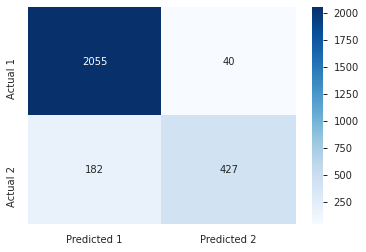

**********************************************
              precision    recall  f1-score   support

           0       0.92      0.98      0.95      2095
           1       0.91      0.70      0.79       609

    accuracy                           0.92      2704
   macro avg       0.92      0.84      0.87      2704
weighted avg       0.92      0.92      0.91      2704



In [ ]:
import matplotlib.pyplot as plt                               # Visualization package
y_test_p = clf.predict(X_test)
%matplotlib inline
import seaborn as sns
print(metrics.accuracy_score(y_test,y_test_p))
print('********************************************')
print('Confusion matrix')
lr_cfm=metrics.confusion_matrix(y_test, y_test_p)


lbl1=["Predicted 1", "Predicted 2"]
lbl2=["Actual 1", "Actual 2"]

sns.heatmap(lr_cfm, annot=True, cmap="Blues", fmt="d", xticklabels=lbl1, yticklabels=lbl2)
plt.show()

print('**********************************************')
print(metrics.classification_report(y_test, y_test_p))

**Conclusion:-**
- With the above analysis and the Models used we see that the best Model of 3 Models (XGBoost, LightGBM & Catboost) is XGBoost provideds 93% accuracy.
- The other two Models show 92% accuracy.